In [89]:
from osgeo import gdal
import matplotlib.pyplot as plt

def get_spectral_bands(file_paths):
    try:
      for tif_file in file_paths:
        dataset = gdal.Open(tif_file)
        if dataset is None:
            print("Failed to open the TIFF file.")
            return

        num_bands = dataset.RasterCount
        spectral_bands = []

        for band_index in range(1, num_bands + 1):
            band = dataset.GetRasterBand(band_index)
            band_data = band.ReadAsArray()
            spectral_bands.append(band_data)

            # Plot each spectral band
            plt.imshow(band_data, cmap='gray')
            plt.title(f"Spectral Band {band_index}")
            plt.show()

        dataset = None  # Close the dataset

        return spectral_bands

    except Exception as e:
        print(f"Error: {str(e)}")

# Provide the path to your .tif file
#if_file = ["/content/DJI_0321.TIF","/content/DJI_0322.TIF","/content/DJI_0323.TIF","/content/DJI_0324.TIF","/content/DJI_0325.TIF"]



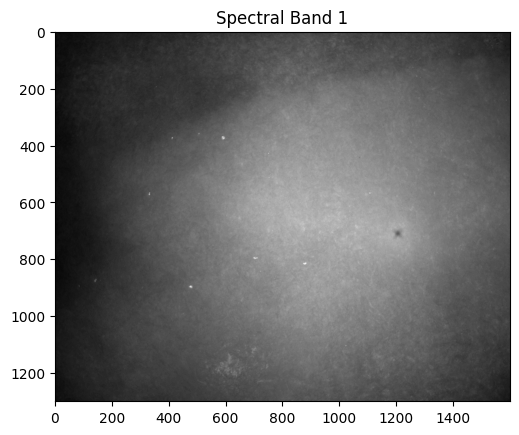

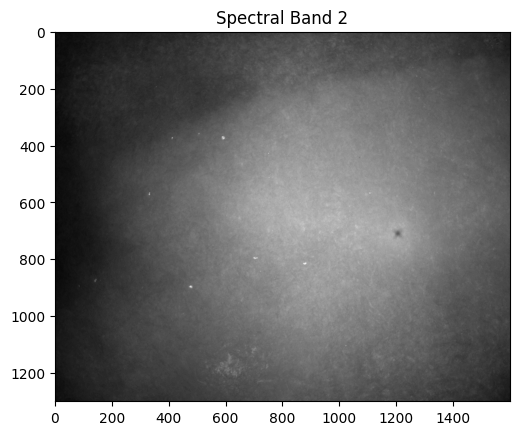

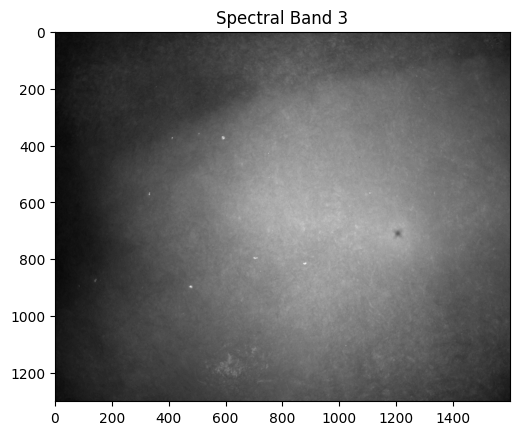

[array([[21120, 20863, 21378, ..., 22911, 24833, 24513],
        [20480, 21184, 20160, ..., 23678, 23810, 24513],
        [20480, 21503, 20672, ..., 25663, 23810, 24066],
        ...,
        [20546, 20351, 19968, ..., 22720, 22144, 22014],
        [20863, 21247, 21054, ..., 21759, 21503, 21759],
        [20607, 20734, 20351, ..., 22400, 22208, 21951]], dtype=uint16),
 array([[21120, 20863, 21378, ..., 22911, 24833, 24513],
        [20480, 21184, 20160, ..., 23678, 23810, 24513],
        [20480, 21503, 20672, ..., 25663, 23810, 24066],
        ...,
        [20546, 20351, 19968, ..., 22720, 22144, 22014],
        [20863, 21247, 21054, ..., 21759, 21503, 21759],
        [20607, 20734, 20351, ..., 22400, 22208, 21951]], dtype=uint16),
 array([[21120, 20863, 21378, ..., 22911, 24833, 24513],
        [20480, 21184, 20160, ..., 23678, 23810, 24513],
        [20480, 21503, 20672, ..., 25661, 23810, 24066],
        ...,
        [20546, 20351, 19968, ..., 22720, 22144, 22014],
        [20863, 2

In [90]:
tif_file2 = ["/Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/Tests/DJI_2671.tif",
             "/Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/Tests/DJI_2672.tif",
             "/Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/Tests/DJI_2673.tif",
             "/Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/Tests/DJI_2674.tif",
             "/Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/Tests/DJI_2675.tif"]

get_spectral_bands(tif_file2)

In [91]:
import rasterio

# Step 1: Open the multispectral image
image_path = tif_file2
for image_path in image_path:
  with rasterio.open(image_path) as dataset:
    # Step 2: Get image shape
    image_shape = dataset.shape
    print("Image Shape:", image_shape)

    # Step 3: Get number of bands
    num_bands = dataset.count
    print("Number of Bands:", num_bands)

    # Step 4: Get spatial resolution
    spatial_resolution = dataset.res
    print("Spatial Resolution:", spatial_resolution)

    # Step 5: Get georeferencing information
    geotransform = dataset.transform
    print("Geotransform:", geotransform)

    # Step 6: Get coordinate reference system (CRS)
    crs = dataset.crs
    print("Coordinate Reference System (CRS):", crs)


Image Shape: (1300, 1600)
Number of Bands: 3
Spatial Resolution: (1.0, 1.0)
Geotransform: | 1.00, 0.00, 0.00|
| 0.00, 1.00, 0.00|
| 0.00, 0.00, 1.00|
Coordinate Reference System (CRS): None
Image Shape: (1300, 1600)
Number of Bands: 3
Spatial Resolution: (1.0, 1.0)
Geotransform: | 1.00, 0.00, 0.00|
| 0.00, 1.00, 0.00|
| 0.00, 0.00, 1.00|
Coordinate Reference System (CRS): None
Image Shape: (1300, 1600)
Number of Bands: 3
Spatial Resolution: (1.0, 1.0)
Geotransform: | 1.00, 0.00, 0.00|
| 0.00, 1.00, 0.00|
| 0.00, 0.00, 1.00|
Coordinate Reference System (CRS): None
Image Shape: (1300, 1600)
Number of Bands: 3
Spatial Resolution: (1.0, 1.0)
Geotransform: | 1.00, 0.00, 0.00|
| 0.00, 1.00, 0.00|
| 0.00, 0.00, 1.00|
Coordinate Reference System (CRS): None
Image Shape: (1300, 1600)
Number of Bands: 3
Spatial Resolution: (1.0, 1.0)
Geotransform: | 1.00, 0.00, 0.00|
| 0.00, 1.00, 0.00|
| 0.00, 0.00, 1.00|
Coordinate Reference System (CRS): None


/Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/.venv/lib/python3.9/site-packages/rasterio/__init__.py:304: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


In [92]:
import rasterio

# Step 1: Read the images
image_paths = tif_file2
dn_values_list = []

for image_path in image_paths:
    with rasterio.open(image_path) as dataset:
        # Step 2: Read the DN values from the first band (red edge band)
        dn = dataset.read(1)

        # Step 3: Access and examine the DN values
        print(f"Digital Number (DN) Values for {image_path}:")
        print(dn)
        print("\n")

        # Store the DN values in the list
        dn_values_list.append(dn)

# Now dn_values_list contains the DN values for each image


Digital Number (DN) Values for /Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/Tests/DJI_2671.tif:
[[21120 20863 21378 ... 22911 24833 24513]
 [20480 21184 20160 ... 23678 23810 24513]
 [20480 21503 20672 ... 25663 23810 24066]
 ...
 [20546 20351 19968 ... 22720 22144 22014]
 [20863 21247 21054 ... 21759 21503 21759]
 [20607 20734 20351 ... 22400 22208 21951]]


Digital Number (DN) Values for /Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/Tests/DJI_2672.tif:
[[22466 22782 21887 ... 23102 23999 24193]
 [22846 21378 22400 ... 22782 24254 25154]
 [22014 22208 21887 ... 23361 24066 24766]
 ...
 [21378 21054 21951 ... 22144 22846 23166]
 [20799 21054 21633 ... 22400 22782 22334]
 [20672 21312 21054 ... 22530 23042 22530]]


Digital Number (DN) Values for /Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/Tests/DJI_2673.tif:
[[22144 23102 23102 ... 23297 23871 23166]
 [23423 23297 24513 ... 23102 23553 23678

In [93]:
import rasterio
# Step 1: Read the digital number (DN) values from the images
#image_paths = ["/content/DJI_0231.TIF","/content/DJI_0232.TIF","/content/DJI_0233.TIF","/content/DJI_0234.TIF","/content/DJI_0235.TIF"]
gain_values = [8.000, 8.000, 4.500, 4.50, 5.00]  # Replace with the appropriate gain values for each image
offset_values = [1.309057, 0.885130, 0.748694, 0.827855, 0.833119]  # Replace with the appropriate offset values for each image

radiance_values_list = []

for i, image_path in enumerate(image_paths):
    with rasterio.open(image_path) as dataset:
        dn = dataset.read(1)  # Assuming DN values are in the first band

        # Step 2: Set the calibration parameters for the current image
        gain = gain_values[i]
        offset = offset_values[i]

        # Step 3: Compute the radiance values
        radiance = (dn * gain) + offset

        # Step 4: Access and examine the radiance values
        print(f"Radiance Values for {image_path}:")
        print(radiance)
        print("\n")

        # Store the radiance values in the list
        radiance_values_list.append(radiance)
# Now radiance_values_list contains the radiance values for each image

Radiance Values for /Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/Tests/DJI_2671.tif:
[[168961.309057 166905.309057 171025.309057 ... 183289.309057
  198665.309057 196105.309057]
 [163841.309057 169473.309057 161281.309057 ... 189425.309057
  190481.309057 196105.309057]
 [163841.309057 172025.309057 165377.309057 ... 205305.309057
  190481.309057 192529.309057]
 ...
 [164369.309057 162809.309057 159745.309057 ... 181761.309057
  177153.309057 176113.309057]
 [166905.309057 169977.309057 168433.309057 ... 174073.309057
  172025.309057 174073.309057]
 [164857.309057 165873.309057 162809.309057 ... 179201.309057
  177665.309057 175609.309057]]


Radiance Values for /Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/Tests/DJI_2672.tif:
[[179728.88513 182256.88513 175096.88513 ... 184816.88513 191992.88513
  193544.88513]
 [182768.88513 171024.88513 179200.88513 ... 182256.88513 194032.88513
  201232.88513]
 [176112.88513 177664.8851

Radiance Values for /Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/Tests/DJI_2671.tif:
[[168961.309057 166905.309057 171025.309057 ... 183289.309057
  198665.309057 196105.309057]
 [163841.309057 169473.309057 161281.309057 ... 189425.309057
  190481.309057 196105.309057]
 [163841.309057 172025.309057 165377.309057 ... 205305.309057
  190481.309057 192529.309057]
 ...
 [164369.309057 162809.309057 159745.309057 ... 181761.309057
  177153.309057 176113.309057]
 [166905.309057 169977.309057 168433.309057 ... 174073.309057
  172025.309057 174073.309057]
 [164857.309057 165873.309057 162809.309057 ... 179201.309057
  177665.309057 175609.309057]]




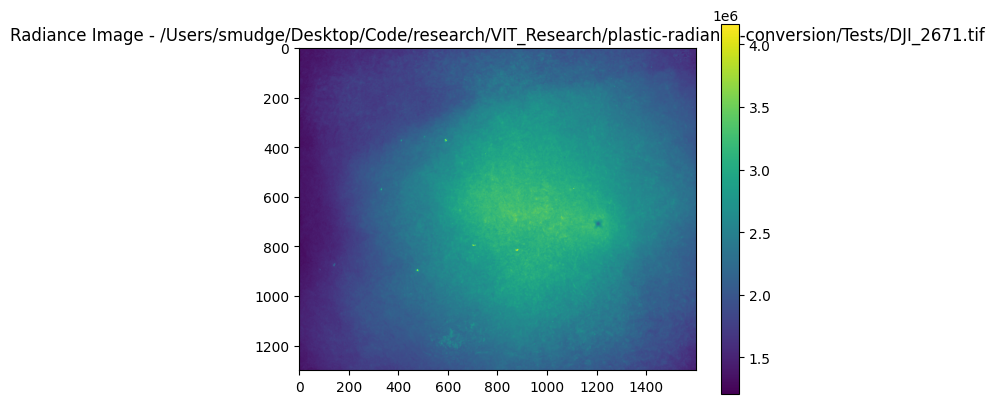

Radiance Values for /Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/Tests/DJI_2672.tif:
[[179728.88513 182256.88513 175096.88513 ... 184816.88513 191992.88513
  193544.88513]
 [182768.88513 171024.88513 179200.88513 ... 182256.88513 194032.88513
  201232.88513]
 [176112.88513 177664.88513 175096.88513 ... 186888.88513 192528.88513
  198128.88513]
 ...
 [171024.88513 168432.88513 175608.88513 ... 177152.88513 182768.88513
  185328.88513]
 [166392.88513 168432.88513 173064.88513 ... 179200.88513 182256.88513
  178672.88513]
 [165376.88513 170496.88513 168432.88513 ... 180240.88513 184336.88513
  180240.88513]]




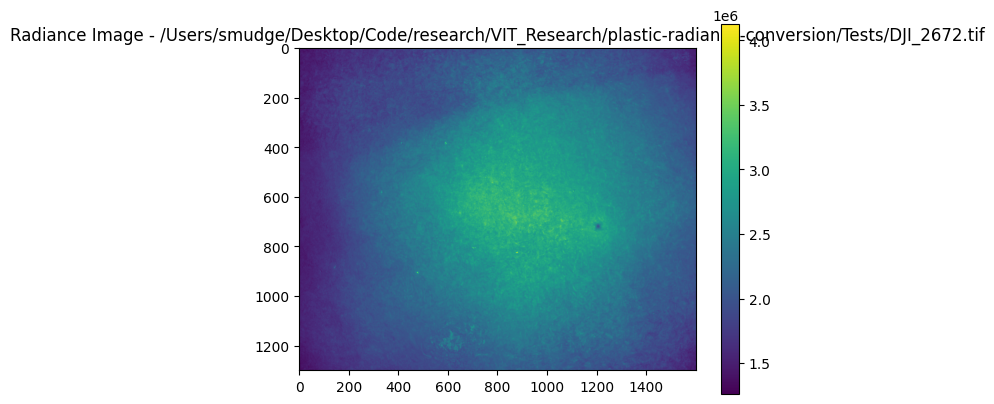

Radiance Values for /Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/Tests/DJI_2673.tif:
[[ 99648.748694 103959.748694 103959.748694 ... 104837.248694
  107420.248694 104247.748694]
 [105404.248694 104837.248694 110309.248694 ... 103959.748694
  105989.248694 106551.748694]
 [107717.248694 103100.248694 103401.748694 ... 110016.748694
  102519.748694 103100.248694]
 ...
 [ 94473.748694  95040.748694  95904.748694 ...  93884.248694
   96201.748694  98780.248694]
 [ 94743.748694  93596.248694  91305.748694 ...  97632.748694
   99063.748694  98492.248694]
 [ 93596.248694  95904.748694  95328.748694 ... 101097.748694
   95328.748694  97349.248694]]




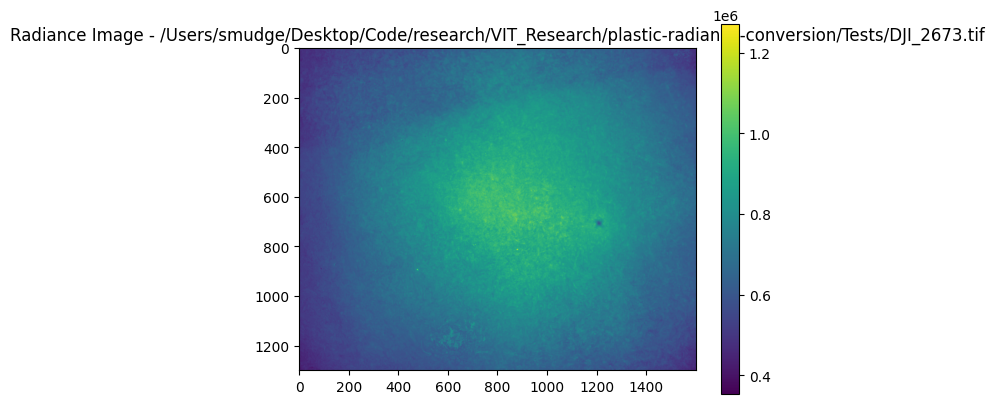

Radiance Values for /Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/Tests/DJI_2674.tif:
[[107996.327855 103401.827855 105989.327855 ... 103401.827855
  102519.827855 105989.327855]
 [105404.327855 105404.327855 105989.327855 ... 104247.827855
  105404.327855 105687.827855]
 [110597.327855 106551.827855 112037.327855 ... 105687.827855
  101664.827855 104247.827855]
 ...
 [ 94743.827855  97043.327855 102240.827855 ... 101664.827855
   99648.827855  98780.327855]
 [ 98217.827855  99936.827855 100800.827855 ... 103100.327855
  102519.827855  99648.827855]
 [ 97916.327855  98780.327855  99648.827855 ...  94473.827855
   96764.327855  98780.327855]]




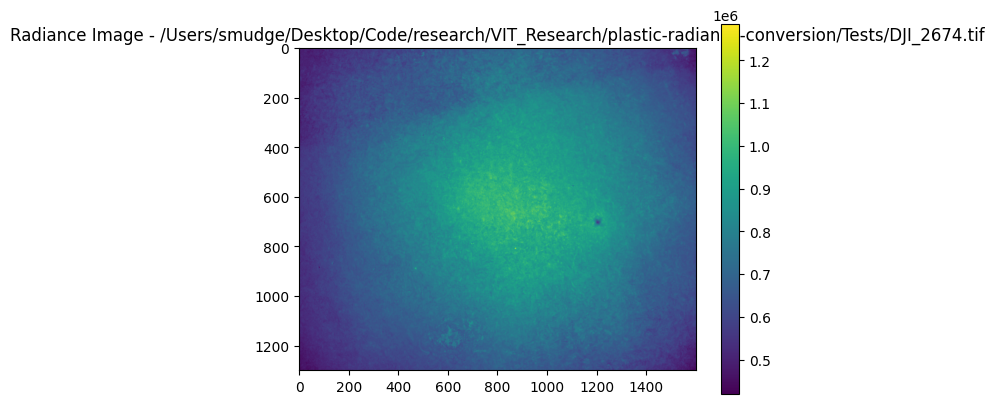

Radiance Values for /Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/Tests/DJI_2675.tif:
[[119995.833119 118075.833119 119995.833119 ... 122240.833119
  115510.833119 118075.833119]
 [118720.833119 125440.833119 121270.833119 ... 124165.833119
  118075.833119 123830.833119]
 [119050.833119 123830.833119 122885.833119 ... 118390.833119
  120640.833119 125125.833119]
 ...
 [119995.833119 117115.833119 116485.833119 ... 117430.833119
  117115.833119 116150.833119]
 [118390.833119 116805.833119 123205.833119 ... 116150.833119
  119685.833119 117430.833119]
 [118390.833119 114555.833119 118720.833119 ... 119050.833119
  119050.833119 115510.833119]]




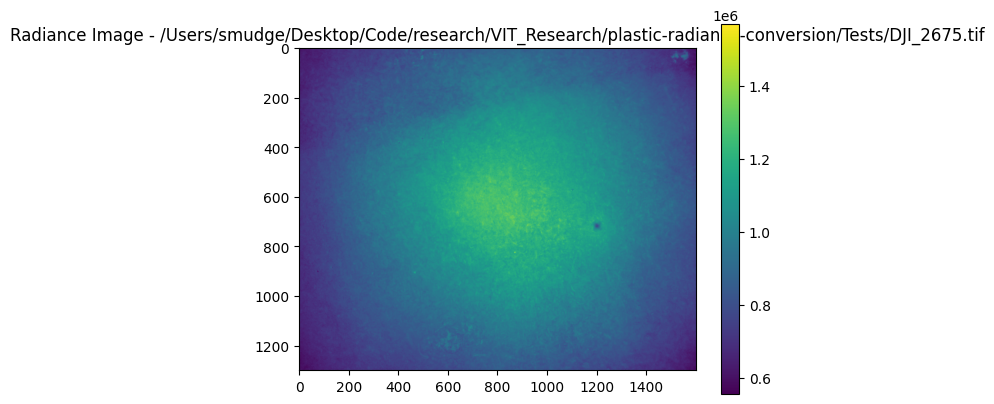

In [94]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
# Step 1: Read the digital number (DN) values from the images
#image_paths = ["/content/DJI_0231.TIF","/content/DJI_0232.TIF","/content/DJI_0233.TIF","/content/DJI_0234.TIF","/content/DJI_0235.TIF"]
gain_values = [8.000, 8.000, 4.500, 4.50, 5.00]  # Replace with the appropriate gain values for each image
offset_values = [1.309057, 0.885130, 0.748694, 0.827855, 0.833119]  # Replace with the appropriate offset values for each image
radiance_values_list = []
for i, image_path in enumerate(image_paths):
    with rasterio.open(image_path) as dataset:
        dn = dataset.read(1)  # Assuming DN values are in the first band
        # Step 2: Set the calibration parameters for the current image
        gain = gain_values[i]
        offset = offset_values[i]
        # Step 3: Compute the radiance values
        radiance = (dn * gain) + offset
        # Step 4: Access and examine the radiance values
        print(f"Radiance Values for {image_path}:")
        print(radiance)
        print("\n")
        # Store the radiance values in the list
        radiance_values_list.append(radiance)
        # Apply gain and offset correction to obtain the corrected radiance values
        corrected_radiance = gain * radiance + offset
        # Convert corrected radiance values to radiance image (assuming single band)
        radiance_image = np.reshape(corrected_radiance, dataset.shape)
        # Display the radiance image
        plt.imshow(radiance_image, cmap='viridis')
        plt.title(f'Radiance Image - {image_path}')
        plt.colorbar()
        plt.show()

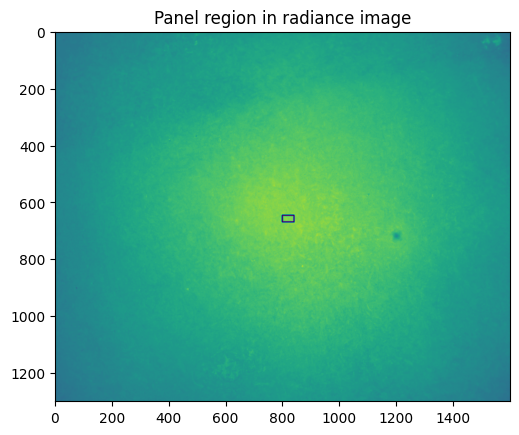

Mean Radiance in panel region: 1285585.433 W/m^2/nm/sr
Radiance to reflectance conversion factor: 0.000


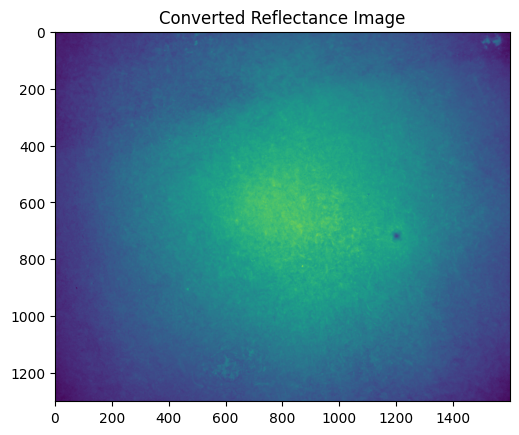

In [95]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

markedImg = radiance_image.copy()
ulx = 799 # upper left column (x coordinate) of panel area
uly = 647 # upper left row (y coordinate) of panel area
lrx = 840 # lower right column (x coordinate) of panel area
lry = 670 # lower right row (y coordinate) of panel area
cv2.rectangle(markedImg,(ulx,uly),(lrx,lry),(0,255,0),3)

# Our panel calibration by band (this is from MicaSense for their specific panel)
panelCalibration = {
    "Blue": 0.67,
    "Green": 0.69,
    "Red": 0.68,
    "Red edge": 0.67,
    "NIR": 0.61
}

# Select panel region from radiance image
panelRegion = radiance_image[uly:lry, ulx:lrx]
plt.imshow(markedImg, cmap='viridis')
plt.title('Panel region in radiance image')
plt.show()

meanRadiance = panelRegion.mean()
print('Mean Radiance in panel region: {:1.3f} W/m^2/nm/sr'.format(meanRadiance))
bandName = "Red edge"  # Replace with the actual band name
panelReflectance = panelCalibration[bandName]
radianceToReflectance = panelReflectance / meanRadiance
print('Radiance to reflectance conversion factor: {:1.3f}'.format(radianceToReflectance))

reflectanceImage = radiance_image * radianceToReflectance
plt.imshow(reflectanceImage, cmap='viridis')
plt.title('Converted Reflectance Image')
plt.show()


Mean Radiance in panel region: 3264705.330 W/m^2/nm/sr
Radiance to reflectance conversion factor: 0.000


/Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/.venv/lib/python3.9/site-packages/rasterio/__init__.py:314: NotGeoreferencedWarning: The given matrix is equal to Affine.identity or its flipped counterpart. GDAL may ignore this matrix and save no geotransform without raising an error. This behavior is somewhat driver-specific.
  dataset = writer(


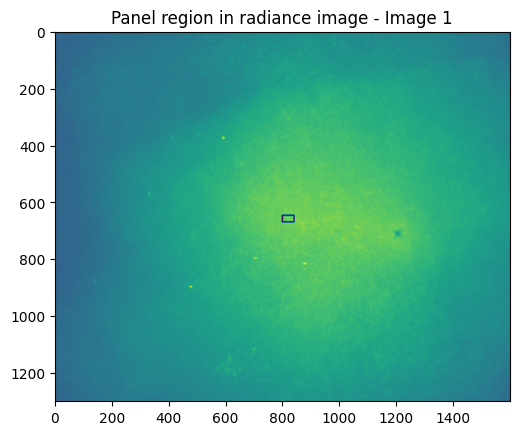

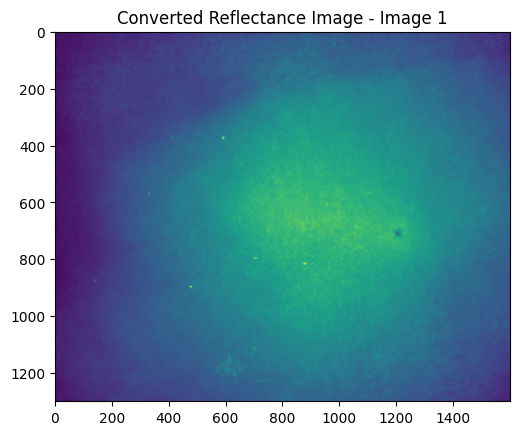

Mean Radiance in panel region: 3165232.348 W/m^2/nm/sr
Radiance to reflectance conversion factor: 0.000


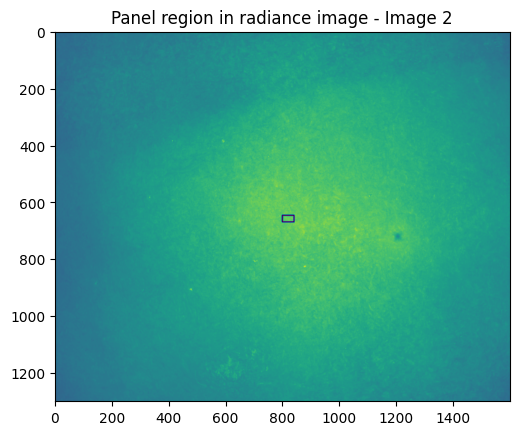

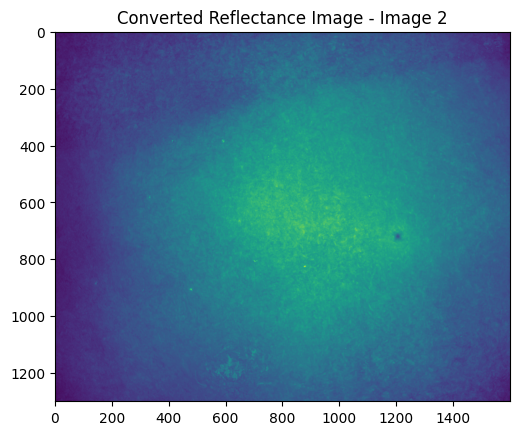

Mean Radiance in panel region: 991000.980 W/m^2/nm/sr
Radiance to reflectance conversion factor: 0.000


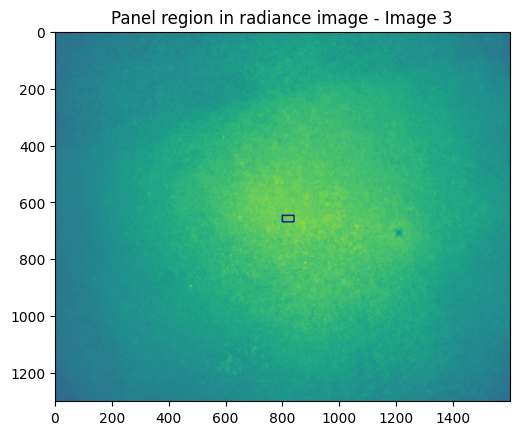

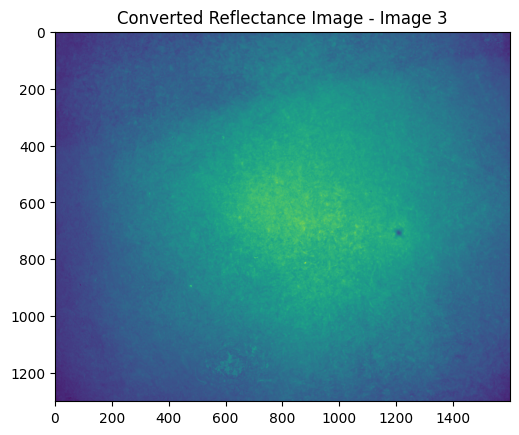

Mean Radiance in panel region: 1005845.567 W/m^2/nm/sr
Radiance to reflectance conversion factor: 0.000


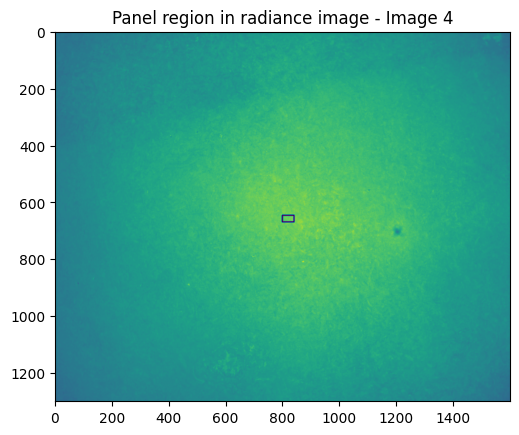

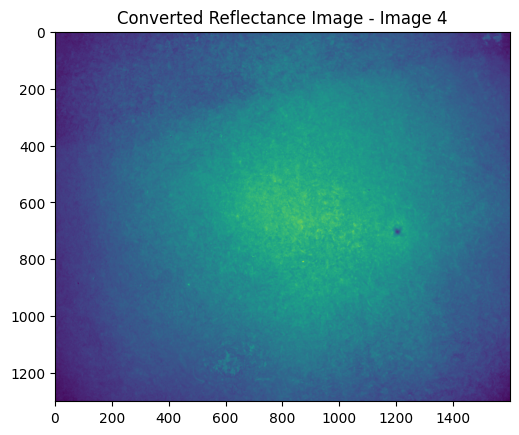

Mean Radiance in panel region: 1285585.433 W/m^2/nm/sr
Radiance to reflectance conversion factor: 0.000


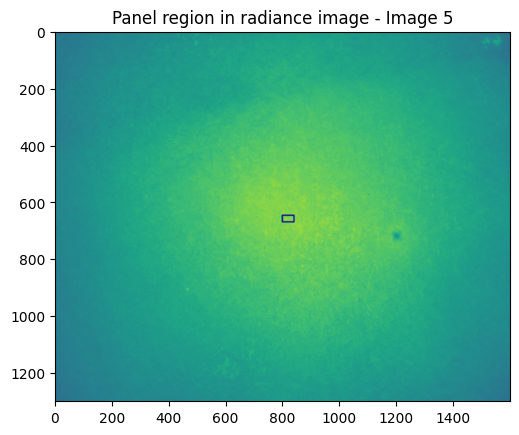

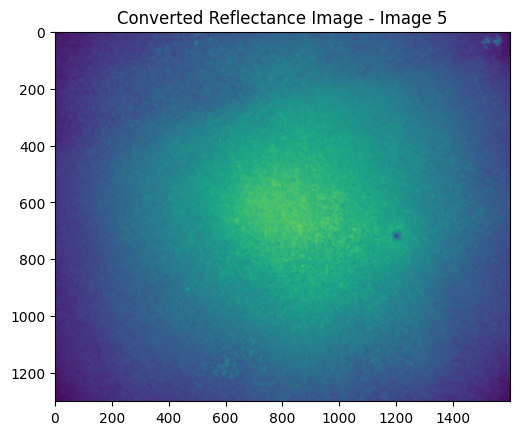

In [96]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import rasterio

def convert_to_reflectance(image_path, gain, offset, band_name, panel_calibration, ulx, uly, lrx, lry, save_path):
    # Read the digital number (DN) values from the image
    with rasterio.open(image_path) as dataset:
        dn = dataset.read(1)  # Assuming DN values are in the first band

    # Compute the radiance values
    radiance = (dn * gain) + offset

    # Apply gain and offset correction to obtain the corrected radiance values
    corrected_radiance = gain * radiance + offset

    # Convert corrected radiance values to radiance image (assuming single band)
    radiance_image = np.reshape(corrected_radiance, dataset.shape)

    # Mark the panel region
    marked_img = radiance_image.copy()
    cv2.rectangle(marked_img, (ulx, uly), (lrx, lry), (0, 255, 0), 3)

    # Select panel region from radiance image
    panel_region = radiance_image[uly:lry, ulx:lrx]

    # Calculate mean radiance in the panel region
    mean_radiance = panel_region.mean()
    print('Mean Radiance in panel region: {:1.3f} W/m^2/nm/sr'.format(mean_radiance))

    # Get the panel reflectance value from the calibration dictionary
    panel_reflectance = panel_calibration[band_name]

    # Compute the radiance to reflectance conversion factor
    radiance_to_reflectance = panel_reflectance / mean_radiance
    print('Radiance to reflectance conversion factor: {:1.3f}'.format(radiance_to_reflectance))

    # Convert radiance values to reflectance
    reflectance_image = radiance_image * radiance_to_reflectance

    # Save the reflectance image
    save_reflectance_image(reflectance_image, dataset.transform, dataset.crs, save_path)

    return reflectance_image, marked_img

def save_reflectance_image(data, transform, crs, save_path):
    with rasterio.open(
        save_path,
        'w',
        driver='GTiff',
        height=data.shape[0],
        width=data.shape[1],
        count=1,  # assuming single band
        dtype=data.dtype,
        crs=crs,
        transform=transform,
    ) as dst:
        dst.write(data, 1)

# Panel calibration by band (this is from MicaSense for their specific panel)
panel_calibration = {
    "Blue": 0.67,
    "Green": 0.69,
    "Red": 0.68,
    "Red edge": 0.67,
    "NIR": 0.61
}

# Image paths
image_paths = tif_file2

# Panel region coordinates
ulx, uly, lrx, lry = 799, 647, 840, 670

# Calibration parameters and band names for each image
calibration_params = [
    {"gain": 8.000, "offset": 1.309057, "band_name": "Blue"},
    {"gain": 8.000, "offset": 0.885130, "band_name": "Green"},
    {"gain": 4.500, "offset": 0.748694, "band_name": "Red"},
    {"gain": 4.50, "offset": 0.827855, "band_name": "Red edge"},
    {"gain": 5.00, "offset": 0.833119, "band_name": "NIR"}
]

# Save paths for reflectance images
save_paths = ["/Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/Tests/reflectance_images/reflectance_image_1.tif", "/Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/Tests/reflectance_images/reflectance_image_2.tif",
              "/Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/Tests/reflectance_images/reflectance_image_3.tif",
              "/Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/Tests/reflectance_images/reflectance_image_4.tif",
              "/Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/Tests/reflectance_images/reflectance_image_5.tif"]

# Process each image
for i, image_path in enumerate(image_paths):
    gain = calibration_params[i]["gain"]
    offset = calibration_params[i]["offset"]
    band_name = calibration_params[i]["band_name"]

    reflectance_image, marked_img = convert_to_reflectance(
        image_path, gain, offset, band_name, panel_calibration, ulx, uly, lrx, lry, save_paths[i]
    )

    # Display the marked region in the radiance image
    plt.imshow(marked_img, cmap='viridis')
    plt.title(f'Panel region in radiance image - Image {i + 1}')
    plt.show()

    # Display the converted reflectance image
    plt.imshow(reflectance_image, cmap='viridis')
    plt.title(f'Converted Reflectance Image - Image {i + 1}')
    plt.show()


Mean Radiance in panel region: 3264705.330 W/m^2/nm/sr
Radiance to reflectance conversion factor: 0.000


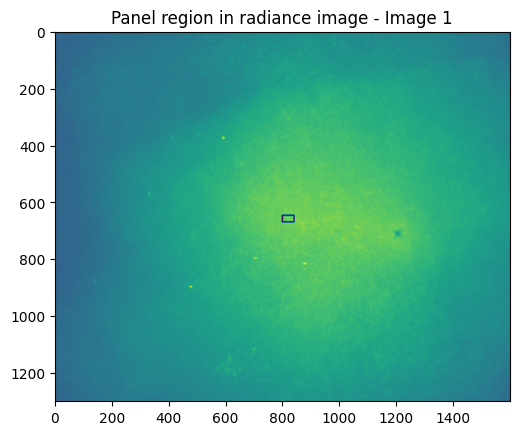

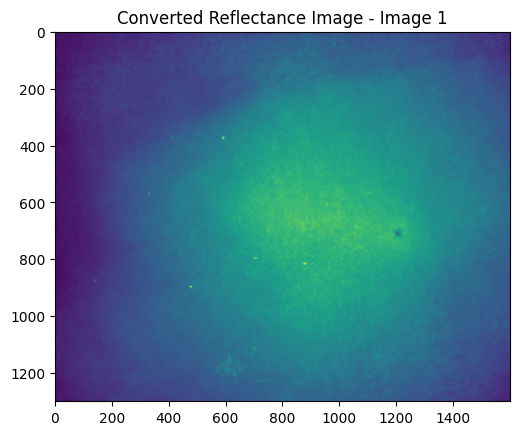

Mean Radiance in panel region: 3165232.348 W/m^2/nm/sr
Radiance to reflectance conversion factor: 0.000


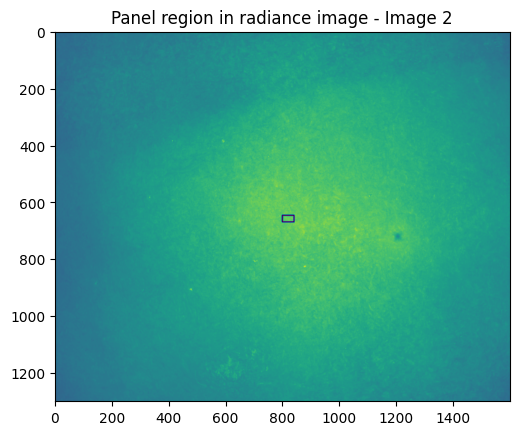

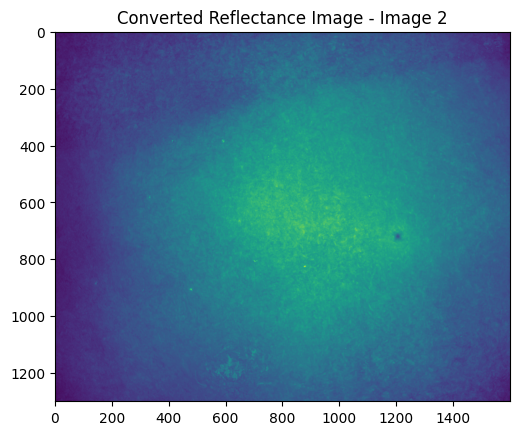

Mean Radiance in panel region: 991000.980 W/m^2/nm/sr
Radiance to reflectance conversion factor: 0.000


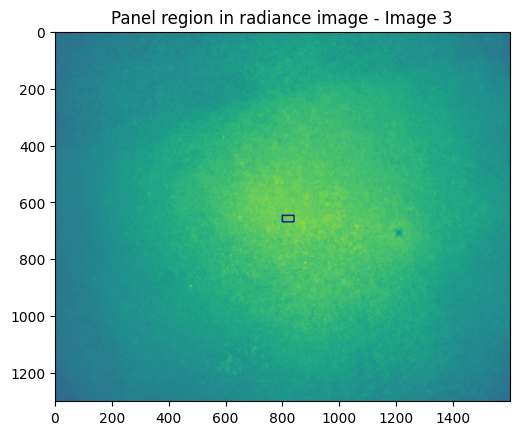

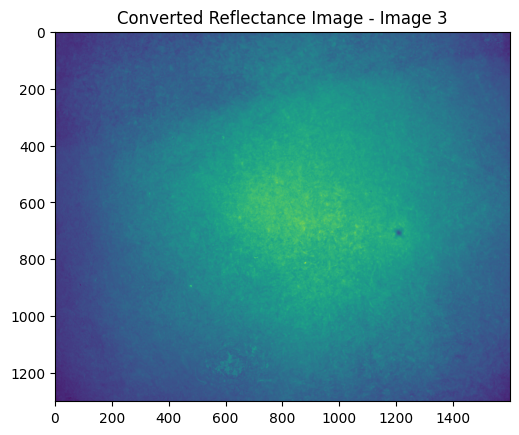

Mean Radiance in panel region: 1005845.567 W/m^2/nm/sr
Radiance to reflectance conversion factor: 0.000


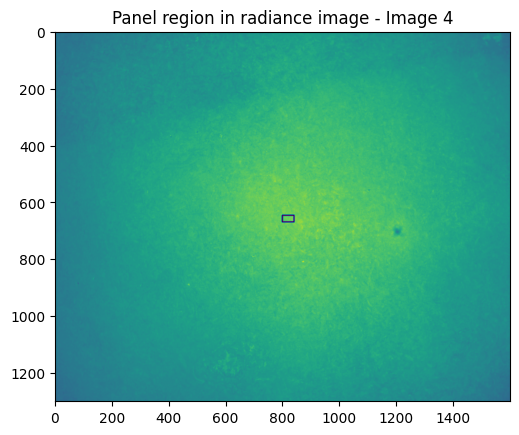

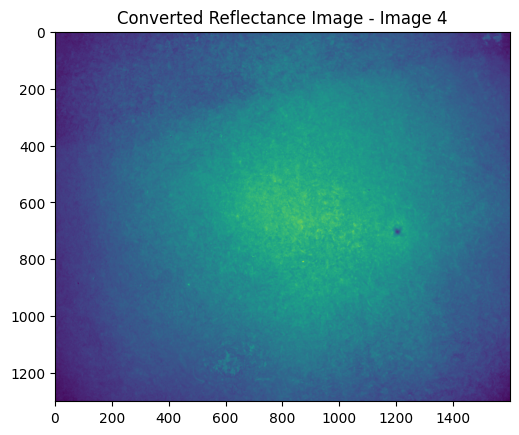

Mean Radiance in panel region: 1285585.433 W/m^2/nm/sr
Radiance to reflectance conversion factor: 0.000


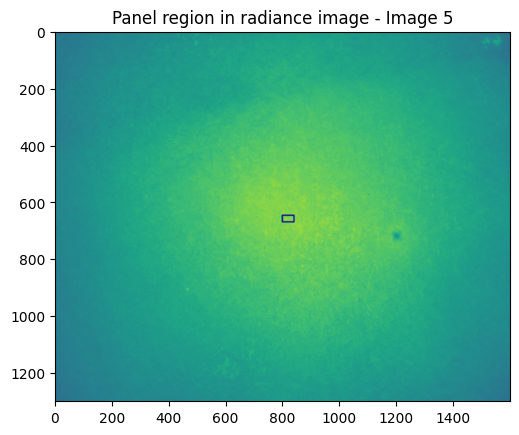

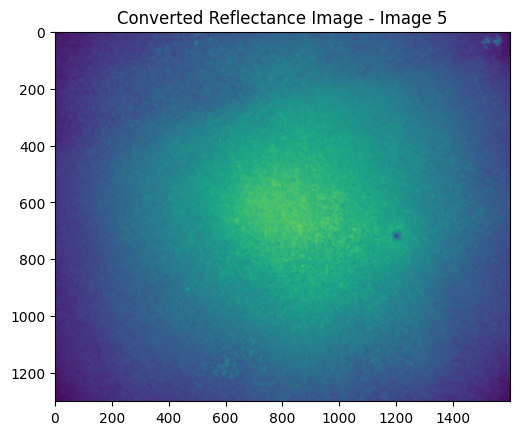

In [97]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import rasterio

def convert_to_reflectance(image_path, gain, offset, band_name, panel_calibration, ulx, uly, lrx, lry, save_path):
    # Read the digital number (DN) values from the image
    with rasterio.open(image_path) as dataset:
        dn = dataset.read(1)  # Assuming DN values are in the first band

    # Compute the radiance values
    radiance = (dn * gain) + offset

    # Apply gain and offset correction to obtain the corrected radiance values
    corrected_radiance = gain * radiance + offset

    # Convert corrected radiance values to radiance image (assuming single band)
    radiance_image = np.reshape(corrected_radiance, dataset.shape)

    # Mark the panel region
    marked_img = radiance_image.copy()
    cv2.rectangle(marked_img, (ulx, uly), (lrx, lry), (0, 255, 0), 3)

    # Select panel region from radiance image
    panel_region = radiance_image[uly:lry, ulx:lrx]

    # Calculate mean radiance in the panel region
    mean_radiance = panel_region.mean()
    print('Mean Radiance in panel region: {:1.3f} W/m^2/nm/sr'.format(mean_radiance))

    # Get the panel reflectance value from the calibration dictionary
    panel_reflectance = panel_calibration[band_name]

    # Compute the radiance to reflectance conversion factor
    radiance_to_reflectance = panel_reflectance / mean_radiance
    print('Radiance to reflectance conversion factor: {:1.3f}'.format(radiance_to_reflectance))

    # Convert radiance values to reflectance
    reflectance_image = radiance_image * radiance_to_reflectance

    # Save the reflectance image
    save_reflectance_image(reflectance_image, dataset.transform, dataset.crs, save_path)

    return reflectance_image, marked_img

def save_reflectance_image(data, transform, crs, save_path):
    with rasterio.open(
        save_path,
        'w',
        driver='GTiff',
        height=data.shape[0],
        width=data.shape[1],
        count=1,  # assuming single band
        dtype=data.dtype,
        crs=crs,
        transform=transform,
    ) as dst:
        dst.write(data, 1)

# Panel calibration by band (this is from MicaSense for their specific panel)
panel_calibration = {
    "Blue": 0.67,
    "Green": 0.69,
    "Red": 0.68,
    "Red edge": 0.67,
    "NIR": 0.61
}

# Image paths
image_paths = tif_file2

# Panel region coordinates
ulx, uly, lrx, lry = 799, 647, 840, 670

# Calibration parameters and band names for each image
calibration_params = [
    {"gain": 8.000, "offset": 1.309057, "band_name": "Blue"},
    {"gain": 8.000, "offset": 0.885130, "band_name": "Green"},
    {"gain": 4.500, "offset": 0.748694, "band_name": "Red"},
    {"gain": 4.50, "offset": 0.827855, "band_name": "Red edge"},
    {"gain": 5.00, "offset": 0.833119, "band_name": "NIR"}
]

# Save paths for reflectance images
save_paths = ["/Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/Tests/reflectance_images/reflectance_image_1.tif", "/Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/Tests/reflectance_images/reflectance_image_2.tif",
              "/Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/Tests/reflectance_images/reflectance_image_3.tif",
              "/Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/Tests/reflectance_images/reflectance_image_4.tif",
              "/Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/Tests/reflectance_images/reflectance_image_5.tif"]

# Process each image
for i, image_path in enumerate(image_paths):
    gain = calibration_params[i]["gain"]
    offset = calibration_params[i]["offset"]
    band_name = calibration_params[i]["band_name"]

    reflectance_image, marked_img = convert_to_reflectance(
        image_path, gain, offset, band_name, panel_calibration, ulx, uly, lrx, lry, save_paths[i]
    )

    # Display the marked region in the radiance image
    plt.imshow(marked_img, cmap='viridis')
    plt.title(f'Panel region in radiance image - Image {i + 1}')
    plt.show()

    # Display the converted reflectance image
    plt.imshow(reflectance_image, cmap='viridis')
    plt.title(f'Converted Reflectance Image - Image {i + 1}')
    plt.show()


In [98]:
src = rasterio.open('/Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/Tests/reflectance_images/reflectance_image_1.tif')
src1= rasterio.open('/Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/Tests/reflectance_images/reflectance_image_2.tif')
src2= rasterio.open('/Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/Tests/reflectance_images/reflectance_image_3.tif')
src3= rasterio.open('/Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/Tests/reflectance_images/reflectance_image_4.tif')
src4= rasterio.open('/Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/Tests/reflectance_images/reflectance_image_5.tif')
band_list = ['Blue','Green','Red','RedEdge','NIR']
i=0  ## for indexing
blue_reflectance=np.array(src.read())
green_reflectance=np.array(src1.read())
red_reflectance=np.array(src2.read())
rededge_reflectance=np.array(src3.read())
NIR_reflectance=np.array(src4.read())


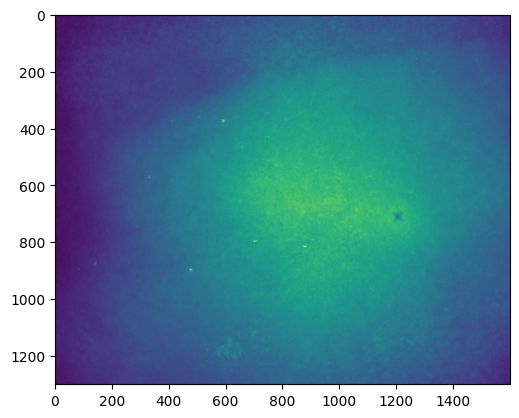

In [99]:
plt.imshow(blue_reflectance[0])

In [100]:
import numpy as np

# Assuming rededge_reflectance and NIR_reflectance are already defined

# Initialize the x array with zeros
x = np.zeros((1300 * 1600, 2))

i = 0
for k in range(1, 1300):
    for l in range(1, 1600):
        x[i, 0] = rededge_reflectance[0, k, l]
        x[i, 1] = NIR_reflectance[0, k, l]
        i += 1

# Reset i and j (assuming you want to reset them for the subsequent code)
i = 0
j = 0



In [101]:
import numpy as np

# Assuming Blue_reflectance is already defined for the first image

# Flatten the blue array
x = blue_reflectance.flatten()

# Find the minimum and maximum values of x
a1 = np.min(x)
a2 = np.max(x)

# Print the results
print("Flattened Array (x):")
print(x)
print("Minimum Value a1:", a1)
print("Maximum Value a2:", a2)


Flattened Array (x):
[0.2774013  0.27402575 0.28078998 ... 0.29421335 0.29169154 0.288316  ]
Minimum Value a1: 0.2480196072312674
Maximum Value a2: 0.8540547253052989


In [102]:
import numpy as np

# Assuming Green_reflectance is already defined for the first image

# Flatten the green array
y = green_reflectance.flatten()

# Find the minimum and maximum values of y
b1 = np.min(y)
b2 = np.max(y)

# Print the results
print("Flattened Array (y):")
print(y)
print("Minimum Value b1:", b1)
print("Maximum Value of b2:", b2)

Flattened Array (y):
[0.31343799 0.31784669 0.30536002 ... 0.31433089 0.3214741  0.31433089]
Minimum Value b1: 0.27500137777451306
Maximum Value of b2: 0.8991533207722467


In [103]:
import numpy as np

# Assuming Red_reflectance is already defined for the first image

# Flatten the red array
z = red_reflectance.flatten()

# Find the minimum and maximum values of z
c1 = np.min(z)
c2 = np.max(z)

# Print the results
print("Flattened Array (z):")
print(z)
print("Minimum Value c1:", c1)
print("Maximum Value c2:", c2)


Flattened Array (z):
[0.30769463 0.32100608 0.32100608 ... 0.31216883 0.29435539 0.30059426]
Minimum Value c1: 0.24277699516047876
Maximum Value c2: 0.8714998446835087


In [104]:
import numpy as np

# Assuming RedEdge_reflectance is already defined for the first image

# Flatten the red edge array
w = rededge_reflectance.flatten()

# Find the minimum and maximum values of w
d1 = np.min(w)
d2 = np.max(w)

# Print the results
print("Flattened Array (w):")
print(w)
print("Minimum Value d1:", d1)
print("Maximum Value d2:", d2)

Flattened Array (w):
[0.32371717 0.30994526 0.31770123 ... 0.28318378 0.2900495  0.29609242]
Minimum Value d1: 0.27967672653152376
Maximum Value d2: 0.8555072455062955


In [105]:
import numpy as np

# Assuming NIR_reflectance is already defined for the first image

# Flatten the NIR array
v = NIR_reflectance.flatten()

# Find the minimum and maximum values of x
e1 = np.min(v)
e2 = np.max(v)

# Print the results
print("Flattened Array (v):")
print(v)
print("Minimum Value e1:", e1)
print("Maximum Value e2:", e2)

Flattened Array (v):
[0.28468571 0.28013058 0.28468571 ... 0.28244373 0.28244373 0.27404522]
Minimum Value e1: 0.26344032873365114
Maximum Value e2: 0.7440058235679


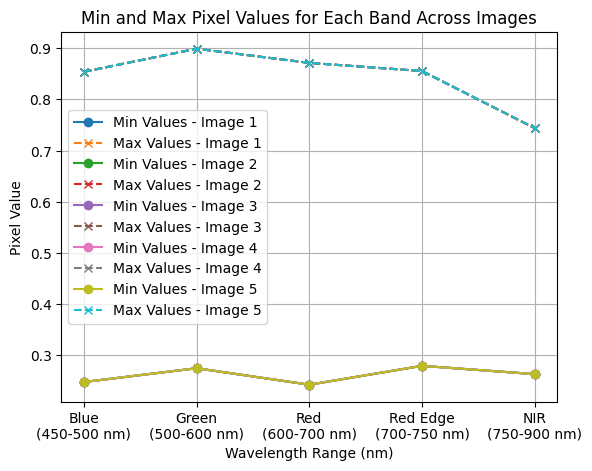

In [106]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming a1, a2, b1, b2, c1, c2, d1, d2, e1, e2 for each image
# Also, assuming wavelength ranges for each band
band_wavelength_ranges = {'Blue': (450, 500), 'Green': (500, 600), 'Red': (600, 700), 'Red Edge': (700, 750), 'NIR': (750, 900)}

# Band names
bands = ['Blue', 'Green', 'Red', 'Red Edge', 'NIR']

# Number of images
num_images = 5

# Create a list of indices for each band
band_indices = np.arange(len(bands))

# Plotting the min and max values for each band as separate lines
for i in range(num_images):
    min_values = [a1, b1, c1, d1, e1]  # Replace with actual values
    max_values = [a2, b2, c2, d2, e2]  # Replace with actual values

    plt.plot(band_indices, min_values, marker='o', linestyle='-', label=f'Min Values - Image {i + 1}')
    plt.plot(band_indices, max_values, marker='x', linestyle='--', label=f'Max Values - Image {i + 1}')

plt.xlabel('Wavelength Range (nm)')
plt.ylabel('Pixel Value')
plt.title('Min and Max Pixel Values for Each Band Across Images')
plt.xticks(band_indices, [f"{band}\n({band_wavelength_ranges[band][0]}-{band_wavelength_ranges[band][1]} nm)" for band in bands])
plt.legend()
plt.grid(True)  # Add grid lines for better readability
plt.show()


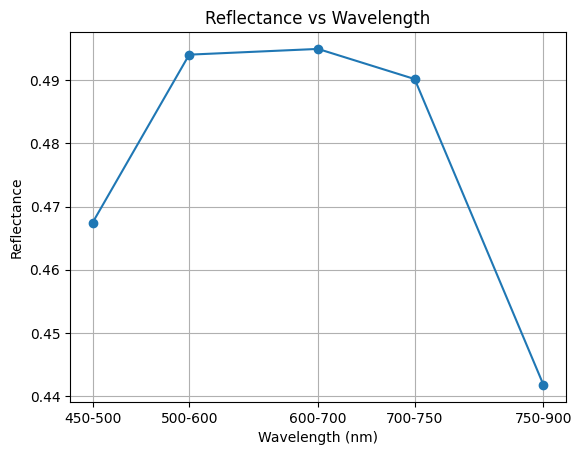

In [107]:
import matplotlib.pyplot as plt

# Assuming wavelength and reflectance arrays are already defined
wavelength_ranges = ["450-500", "500-600", "600-700", "700-750", "750-900"]  # Replace with your actual wavelength range values
reflectance = [np.mean(x), np.mean(y), np.mean(z), np.mean(w), np.mean(v)]  # Replace with your actual reflectance values

# Extract the midpoints of each wavelength range
wavelength_midpoints = [(int(start) + int(end)) / 2 for start, end in [range.split('-') for range in wavelength_ranges]]

# Plotting the reflectance vs wavelength graph
plt.plot(wavelength_midpoints, reflectance, marker='o', linestyle='-')
plt.xlabel('Wavelength (nm)')
plt.ylabel('Reflectance')
plt.title('Reflectance vs Wavelength')
plt.xticks(wavelength_midpoints, wavelength_ranges)  # Set x-axis ticks and labels
plt.grid(True)
plt.show()


In [ ]:
import matplotlib.pyplot as plt

# Assuming wavelength and reflectance arrays are already defined
wavelength_ranges = ["450-500", "500-600", "600-700", "700-750", "750-900"]  # Replace with your actual wavelength range values
reflectance = [1.532, 1.147, 1.610, 1.602, 1.279]  # Replace with your actual reflectance values

# Extract the midpoints of each wavelength range
wavelength_midpoints = [(int(start) + int(end)) / 2 for start, end in [range.split('-') for range in wavelength_ranges]]

# Plotting the reflectance vs wavelength graph
plt.plot(wavelength_midpoints, reflectance, marker='o', linestyle='-')
plt.xlabel('Wavelength (nm)')
plt.ylabel('Reflectance')
plt.title('Reflectance vs Wavelength')
plt.xticks(wavelength_midpoints, wavelength_ranges)  # Set x-axis ticks and labels
plt.grid(True)
plt.show()


Comparison for Heavy Metal


In [108]:
# Pesticide Range

pmin1=0.14
pmin2=0.18
pmin3=0.1
pmin4=0.19
pmin5=0.19
pmax1=1.7
pmax2=1.59
pmax3=1.41
pmax4=1.4
pmax5=1.199

# Non-Pesticide Range

npmin1=0.1
npmin2=0.19
npmin3=0.1
npmin4=0.18
npmin5=0.18
npmax1=1.7
npmax2=1.59
npmax3=1.405
npmax4=1.399
npmax5=1.19

x1=abs(npmin1-pmin1)
x2=abs(npmax1-pmax1)
y1=abs(npmin2-pmin2)
y2=abs(npmax2-pmax2)
z1=abs(npmin3-pmin3)
z2=abs(npmax3-pmax3)
w1=abs(npmin4-pmin4)
w2=abs(npmax4-pmax4)
v1=abs(npmin5-pmin5)
v2=abs(npmax5-pmax5)

print(a1-pmin1,x1)
print(a2-pmax1,x2)
print(b1-pmin2,y1)
print(b2-pmax2,y2)
print(c1-pmin3,z1)
print(c2-pmax3,z2)
print(d1-pmin4,w1)
print(d2-pmax4,w2)
print(e1-pmin5,v1)
print(e2-pmax5,v2)

cond1=(a1-npmin1<=x1)
cond2=(a2-npmax1<=x2)
cond3=(b1-npmin2<=y1)
cond4=(b2-npmax2<=y2)
cond5=(c1-npmin3<=z1)
cond6=(c2-npmax3<=z2)
cond7=(d1-npmin4<=w1)
cond8=(d2-npmax4<=w2)
cond9=(e1-npmin5<=v1)
cond10=(e2-npmax5<=v2)

print(cond1)
print(cond2)
print(cond3)
print(cond4)
print(cond5)
print(cond6)
print(cond7)
print(cond8)
print(cond9)
print(cond10)


# Comparison
if ((cond1  or cond2) and (cond3 or cond4) and (cond5 or cond6) and (cond7 or cond8) and (cond9 or cond10)):
  print("Heavy Metal Trace Not Detected")
else:
  print("Heavy Metal Trace  Detected")



0.10801960723126738 0.04000000000000001
-0.845945274694701 0.0
0.09500137777451306 0.010000000000000009
-0.6908466792277533 0.0
0.14277699516047876 0.0
-0.5385001553164912 0.004999999999999893
0.08967672653152375 0.010000000000000009
-0.5444927544937044 0.0009999999999998899
0.07344032873365114 0.010000000000000009
-0.45499417643210005 0.009000000000000119
False
True
False
True
False
True
False
True
False
True
Heavy Metal Trace Not Detected


Mean Radiance in panel region: 3264705.330 W/m^2/nm/sr
Radiance to reflectance conversion factor: 0.000


/Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/.venv/lib/python3.9/site-packages/rasterio/__init__.py:314: NotGeoreferencedWarning: The given matrix is equal to Affine.identity or its flipped counterpart. GDAL may ignore this matrix and save no geotransform without raising an error. This behavior is somewhat driver-specific.
  dataset = writer(


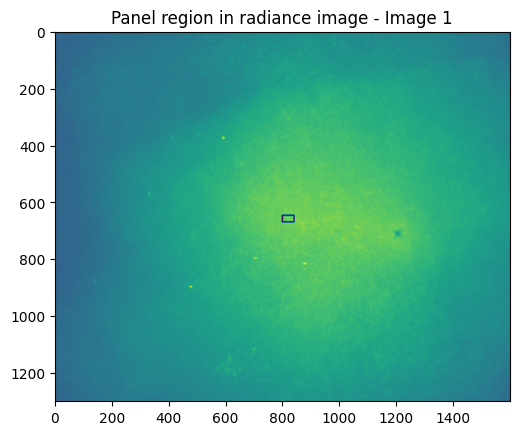

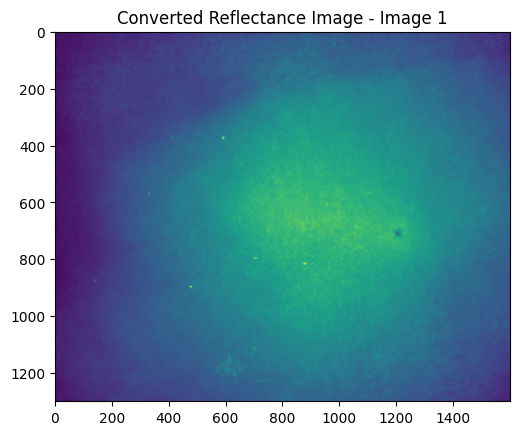

Mean Radiance in panel region: 3165232.348 W/m^2/nm/sr
Radiance to reflectance conversion factor: 0.000


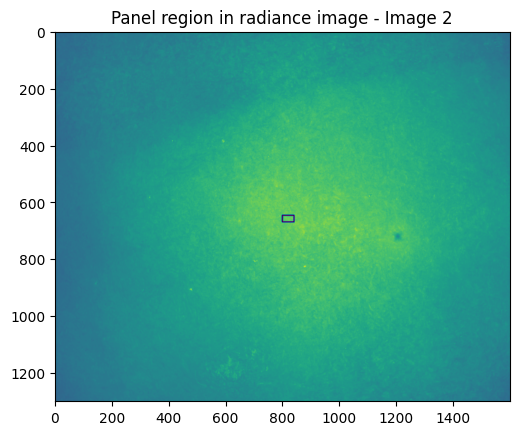

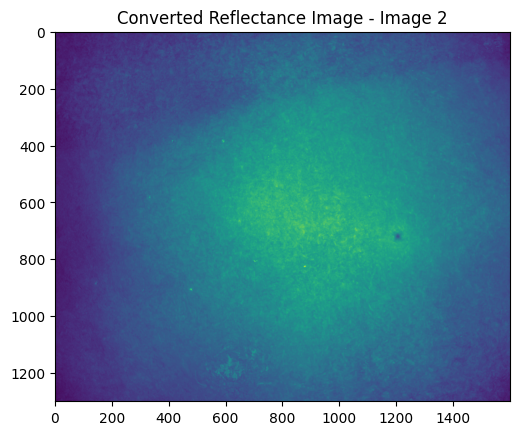

Mean Radiance in panel region: 991000.980 W/m^2/nm/sr
Radiance to reflectance conversion factor: 0.000


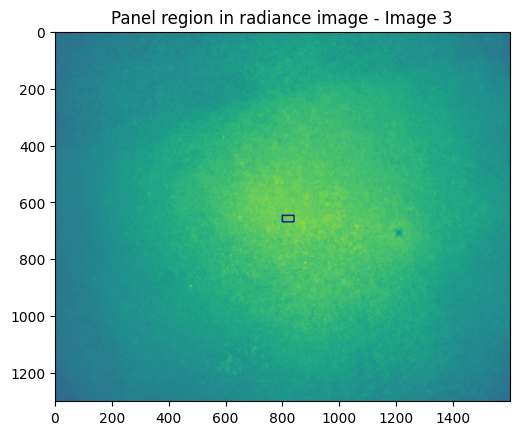

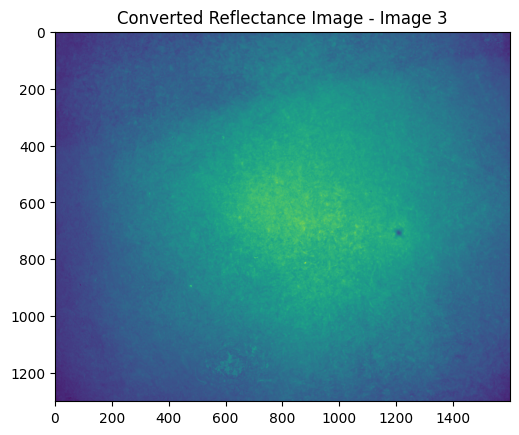

Mean Radiance in panel region: 1005845.567 W/m^2/nm/sr
Radiance to reflectance conversion factor: 0.000


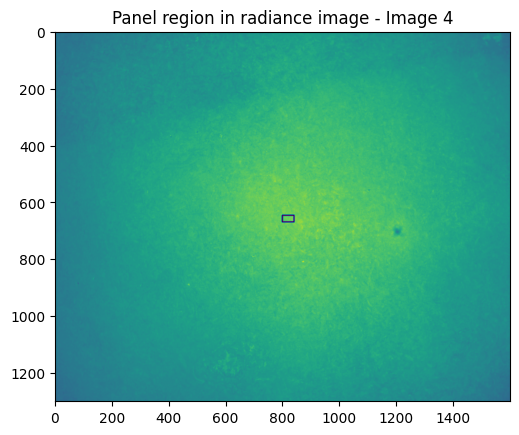

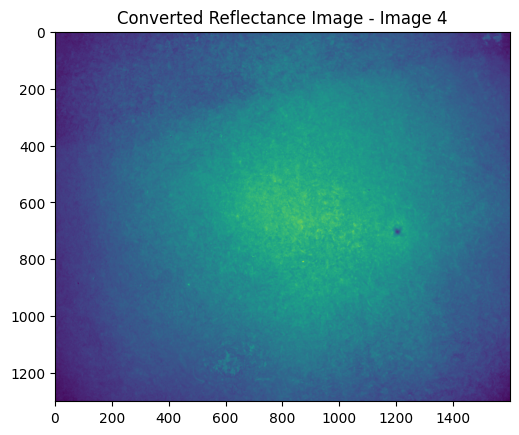

Mean Radiance in panel region: 1285585.433 W/m^2/nm/sr
Radiance to reflectance conversion factor: 0.000


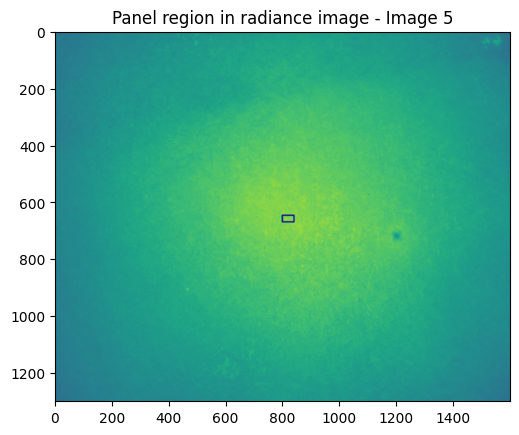

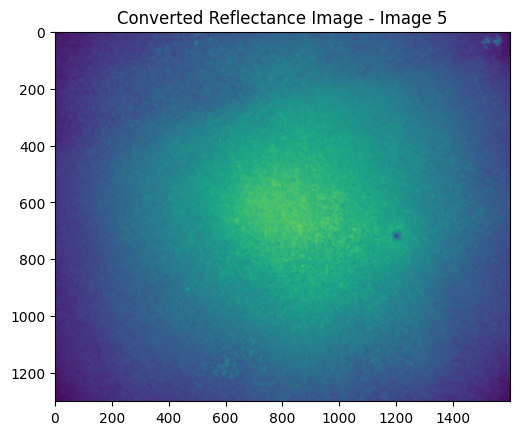

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import rasterio

def convert_to_reflectance(image_path, gain, offset, band_name, panel_calibration, ulx, uly, lrx, lry, save_path):
    # Read the digital number (DN) values from the image
    with rasterio.open(image_path) as dataset:
        dn = dataset.read(1)  # Assuming DN values are in the first band

    # Compute the radiance values
    radiance = (dn * gain) + offset

    # Apply gain and offset correction to obtain the corrected radiance values
    corrected_radiance = gain * radiance + offset

    # Convert corrected radiance values to radiance image (assuming single band)
    radiance_image = np.reshape(corrected_radiance, dataset.shape)

    # Mark the panel region
    marked_img = radiance_image.copy()
    cv2.rectangle(marked_img, (ulx, uly), (lrx, lry), (0, 255, 0), 3)

    # Select panel region from radiance image
    panel_region = radiance_image[uly:lry, ulx:lrx]

    # Calculate mean radiance in the panel region
    mean_radiance = panel_region.mean()
    print('Mean Radiance in panel region: {:1.3f} W/m^2/nm/sr'.format(mean_radiance))

    # Get the panel reflectance value from the calibration dictionary
    panel_reflectance = panel_calibration[band_name]

    # Compute the radiance to reflectance conversion factor
    radiance_to_reflectance = panel_reflectance / mean_radiance
    print('Radiance to reflectance conversion factor: {:1.3f}'.format(radiance_to_reflectance))

    # Convert radiance values to reflectance
    reflectance_image = radiance_image * radiance_to_reflectance

    # Save the reflectance image
    save_reflectance_image(reflectance_image, dataset.transform, dataset.crs, save_path)

    return reflectance_image, marked_img

def save_reflectance_image(data, transform, crs, save_path):
    with rasterio.open(
        save_path,
        'w',
        driver='GTiff',
        height=data.shape[0],
        width=data.shape[1],
        count=1,  # assuming single band
        dtype=data.dtype,
        crs=crs,
        transform=transform,
    ) as dst:
        dst.write(data, 1)

# Panel calibration by band (this is from MicaSense for their specific panel)
panel_calibration = {
    "Blue": 0.67,
    "Green": 0.69,
    "Red": 0.68,
    "Red edge": 0.67,
    "NIR": 0.61
}

# Image paths
image_paths = tif_file2

# Panel region coordinates
ulx, uly, lrx, lry = 799, 647, 840, 670

# Calibration parameters and band names for each image
calibration_params = [
    {"gain": 8.000, "offset": 1.309057, "band_name": "Blue"},
    {"gain": 8.000, "offset": 0.885130, "band_name": "Green"},
    {"gain": 4.500, "offset": 0.748694, "band_name": "Red"},
    {"gain": 4.50, "offset": 0.827855, "band_name": "Red edge"},
    {"gain": 5.00, "offset": 0.833119, "band_name": "NIR"}
]

# Save paths for reflectance images
save_paths = ["/Users/smudge/Desktop/C`ode/research/VIT_Research/plastic-radiance-conversion/Tests/reflectance_images/reflectance_image_1.tif", "/Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/Tests/reflectance_images/reflectance_image_2.tif",
              "/Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/Tests/reflectance_images/reflectance_image_3.tif",
              "/Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/Tests/reflectance_images/reflectance_image_4.tif",
              "/Users/smudge/Desktop/Code/research/VIT_Research/plastic-radiance-conversion/Tests/reflectance_images/reflectance_image_5.tif"]

# Process each image
for i, image_path in enumerate(image_paths):
    gain = calibration_params[i]["gain"]
    offset = calibration_params[i]["offset"]
    band_name = calibration_params[i]["band_name"]

    reflectance_image, marked_img = convert_to_reflectance(
        image_path, gain, offset, band_name, panel_calibration, ulx, uly, lrx, lry, save_paths[i]
    )

    # Display the marked region in the radiance image
    plt.imshow(marked_img, cmap='viridis')
    plt.title(f'Panel region in radiance image - Image {i + 1}')
    plt.show()

    # Display the converted reflectance image
    plt.imshow(reflectance_image, cmap='viridis')
    plt.title(f'Converted Reflectance Image - Image {i + 1}')
    plt.show()
